In [2]:
import scanpy as sc
import pandas as pd
from scipy.io import mmread

# Load matrix
X = mmread("counts.mtx").T.tocsc()   # transpose to cells × genes

# Load genes and metadata
genes = pd.read_csv("genes.csv")["gene"].values
meta = pd.read_csv("metadata.csv", index_col=0)

# Build AnnData
adata = sc.AnnData(X=X, obs=meta)
adata.var_names = genes

# Register spatial coordinates
adata.obsm["spatial"] = adata.obs[["x", "y"]].to_numpy()

adata

/Users/ahn/squidpy_env/lib/python3.13/site-packages/anndata/_core/anndata.py:1791: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 71043 × 480
    obs: 'nCount_RNA', 'nFeature_RNA', 'samples', 'batch', 'RNA_snn_res.0.3', 'RNA_snn_res.0.5', 'RNA_snn_res.0.8', 'RNA_snn_res.1', 'RNA_snn_res.1.5', 'seurat_clusters', 'CellType', 'x', 'y', 'cell_id'
    obsm: 'spatial'

  0%|                                                                      | 0/1000 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

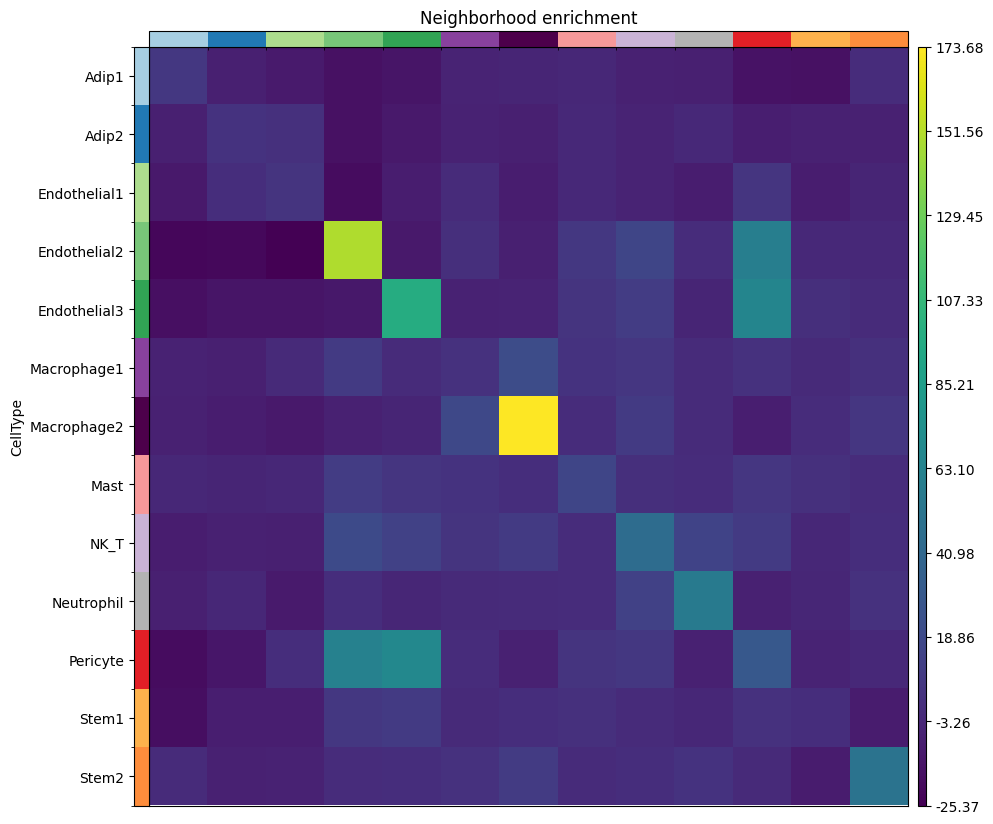

In [3]:
# 1. Add library_id column from samples, but categorical
adata.obs["library_id"] = adata.obs["samples"].astype("category")

# 2. Ensure spatial coordinates exist
if "spatial" not in adata.obsm:
    adata.obsm["spatial"] = adata.obs[["x", "y"]].to_numpy()

# 3. Register dummy spatial metadata for each library
adata.uns["spatial"] = {}
for lib in adata.obs["library_id"].cat.categories:
    adata.uns["spatial"][lib] = {
        "metadata": {},
        "scalefactors": {"spot_diameter_fullres": 1},  # placeholder
    }

# 4. Build neighbors (now per-library)
import squidpy as sq
sq.gr.spatial_neighbors(adata, library_key="library_id")

# 5. Run neighborhood enrichment
adata.obs["CellType"] = adata.obs["CellType"].astype("category")
sq.gr.nhood_enrichment(adata, cluster_key="CellType", library_key="library_id")

# Define colors in order of CellType categories
color_dict = {
    "Adip1": "#a6cee2",
    "Adip2": "#2179b4",
    "Endothelial1": "#ADDD8E",
    "Endothelial2": "#78C679",
    "Endothelial3": "#31A354",
    "Macrophage1": "#88419D",
    "Macrophage2": "#4D004B",
    "Mast": "#f6999a",
    "NK_T": "#cab3d6",
    "Neutrophil": "#B3B3B3",
    "Pericyte": "#e21f26",
    "Stem1": "#FEB24C",
    "Stem2": "#FD8D3C"
}
# 6. Plot enrichment heatmap and save as PDF
sq.pl.nhood_enrichment(
    adata,
    cluster_key="CellType",
    palette=color_dict,
    save="_nhood_enrichment.pdf"  # saved in ./figures/ by default
)

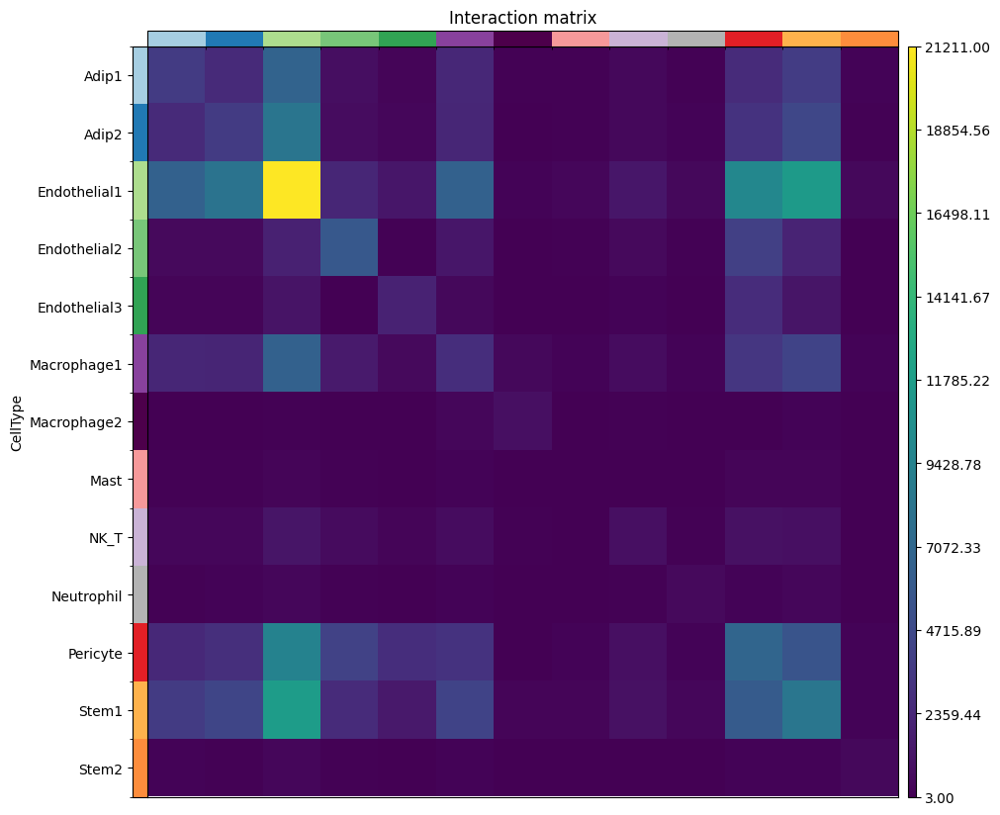

In [4]:
import squidpy as sq

# Run interaction matrix (if not already computed)
sq.gr.interaction_matrix(adata, cluster_key="CellType")

# Plot and save to PDF
sq.pl.interaction_matrix(
    adata,
    cluster_key="CellType",
    palette=color_dict,
    save="_interaction_matrix.pdf"
)

/Users/ahn/squidpy_env/lib/python3.13/site-packages/anndata/_core/anndata.py:1791: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Running co-occurrence for library 10638...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 11753...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 11754...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 12114...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 20446...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 21295...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 21613...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 21641...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 21670...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 21710...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 21760...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

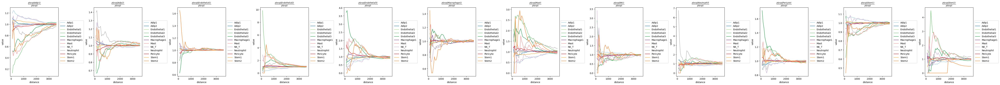

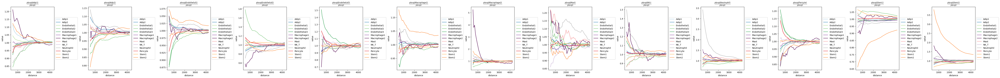

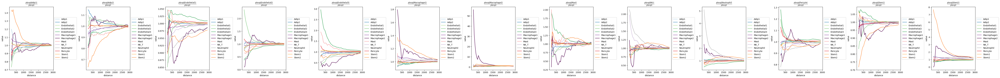

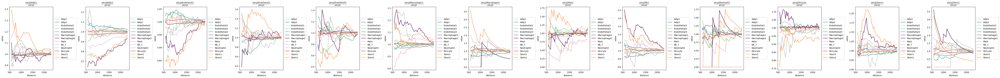

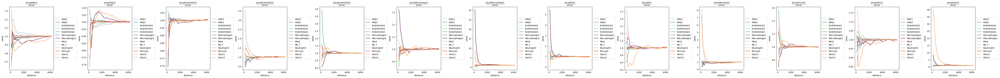

...

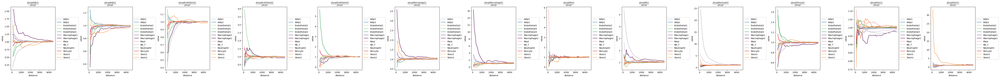

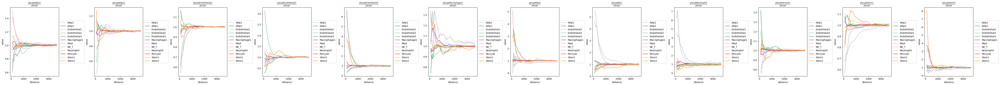

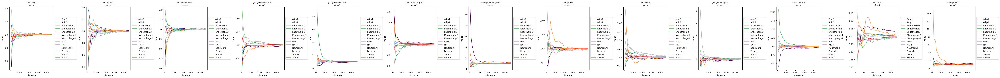

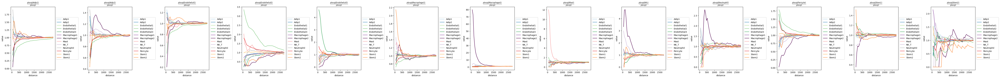

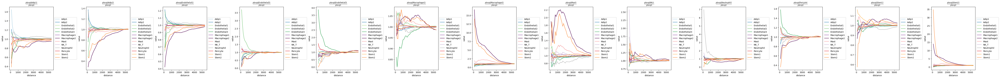

In [5]:
import squidpy as sq

# Ensure categorical
adata.obs["CellType"] = adata.obs["CellType"].astype("category")

# Register your colors
adata.uns["CellType_colors"] = [
    color_dict[ct] for ct in adata.obs["CellType"].cat.categories
]

# Loop over each library
for lib in adata.obs["library_id"].cat.categories:
    print(f"Running co-occurrence for library {lib}...")

    adata_sub = adata[adata.obs["library_id"] == lib].copy()

    # Compute co-occurrence
    sq.gr.co_occurrence(adata_sub, cluster_key="CellType")

    # Plot and save PDF (will now use your custom colors)
    sq.pl.co_occurrence(
        adata_sub,
        cluster_key="CellType",
        save=f"_co_occurrence_{lib}.pdf"
    )

In [43]:
import pandas as pd
import numpy as np
import squidpy as sq

all_curves = []

# Identify good samples (only those with all 13 cell types)
expected_cts = set(adata.obs["CellType"].cat.categories)
good_samples = []
for lib in adata.obs["samples"].unique():
    sub_cts = set(adata.obs.loc[adata.obs["samples"] == lib, "CellType"].unique())
    if expected_cts.issubset(sub_cts):
        good_samples.append(lib)

print(f"Good samples (13 cell types): {good_samples}")

# Loop over good samples
for lib in good_samples:
    print(f"Processing sample {lib}...")
    adata_sub = adata[adata.obs["samples"] == lib].copy()
    adata_sub.obs["CellType"] = adata_sub.obs["CellType"].astype("category")

    # Run co-occurrence
    sq.gr.co_occurrence(adata_sub, cluster_key="CellType")

    # Extract results
    res = adata_sub.uns["CellType_co_occurrence"]["occ"]  # (n_celltypes, n_bins)
    n_ct, n_bins = res.shape

    # Reconstruct distance bins (default = 50 px increments)
    distances = np.arange(n_bins) * 50

    # Convert to DataFrame (one curve per cell type)
    for i, ct in enumerate(adata_sub.obs["CellType"].cat.categories):
        values = np.array(res[i, :]).flatten()
        df = pd.DataFrame({
            "sample": lib,
            "CellType": ct,
            "distance": distances,
            "co_occurrence": values
        })
        all_curves.append(df)

# Combine all samples into one tidy DataFrame
curves_df = pd.concat(all_curves, ignore_index=True)

# Save to CSV for later use in R
curves_df.to_csv("co_occurrence_curves_allSamples.csv", index=False)

print("✅ Exported co-occurrence results to co_occurrence_curves_allSamples.csv")
print(curves_df.head())

/Users/ahn/squidpy_env/lib/python3.13/site-packages/anndata/_core/anndata.py:1791: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Good samples (13 cell types): [np.int64(11753), np.int64(11754), np.int64(12114), np.int64(20446), np.int64(21295), np.int64(21613), np.int64(21670), np.int64(21710), np.int64(21760)]
Processing sample 11753...



  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method d

ValueError: too many values to unpack (expected 2)

Running co-occurrence for library 10638...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 11753...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 11754...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 12114...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 20446...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 21295...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 21613...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 21641...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 21670...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 21710...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

Running co-occurrence for library 21760...


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

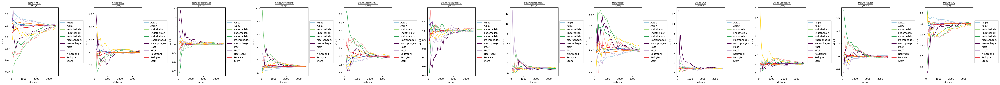

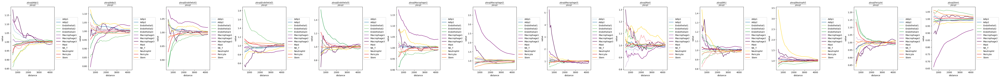

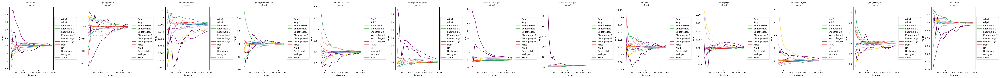

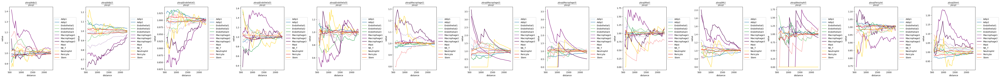

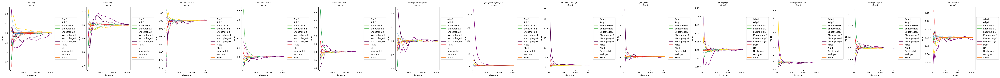

...

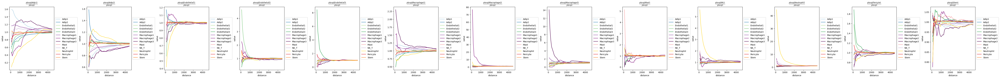

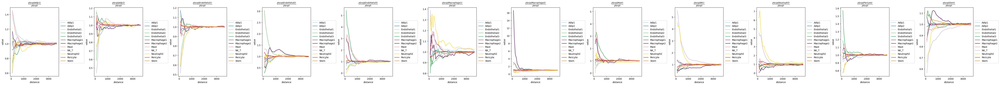

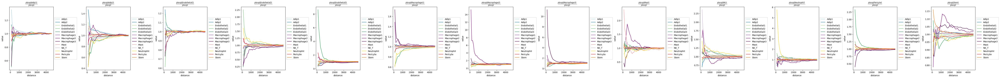

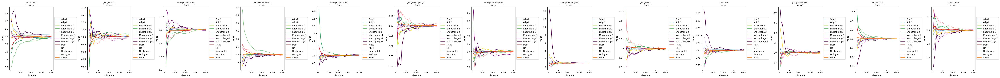

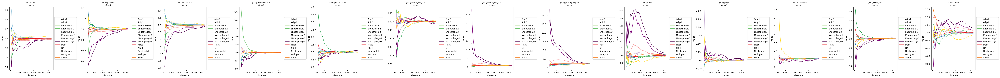

In [118]:
import matplotlib.colors as mcolors
import squidpy as sq

# Define colors in order of CellType categories
color_dict = {
    "Adip1": "#a6cee2",
    "Adip2": "#2179b4",
    "Endothelial1": "#ADDD8E",
    "Endothelial2": "#78C679",
    "Endothelial3": "#31A354",
    "Macrophage1": "#88419D",
    "Macrophage2": "#4D004B",
    "Mast": "#f6999a",
    "NK_T": "#cab3d6",
    "Neutrophil": "#B3B3B3",
    "Pericyte": "#e21f26",
    "Stem1": "#FEB24C",
    "Stem2": "#FD8D3C"
}

# Match colors to category order
cats = list(adata.obs["CellType"].cat.categories)
palette_ordered = [color_dict[c] for c in cats]

# Convert to ListedColormap
cmap = mcolors.ListedColormap(palette_ordered)

# Loop over libraries
for lib in adata.obs["library_id"].cat.categories:
    print(f"Running co-occurrence for library {lib}...")

    adata_sub = adata[adata.obs["library_id"] == lib].copy()
    sq.gr.co_occurrence(adata_sub, cluster_key="CellType")

    sq.pl.co_occurrence(
        adata_sub,
        cluster_key="CellType",
        palette=cmap,  # <- ListedColormap, not list
        save=f"_co_occurrence_{lib}.pdf"
    )

Using 9 samples with all 13 cell types.


  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

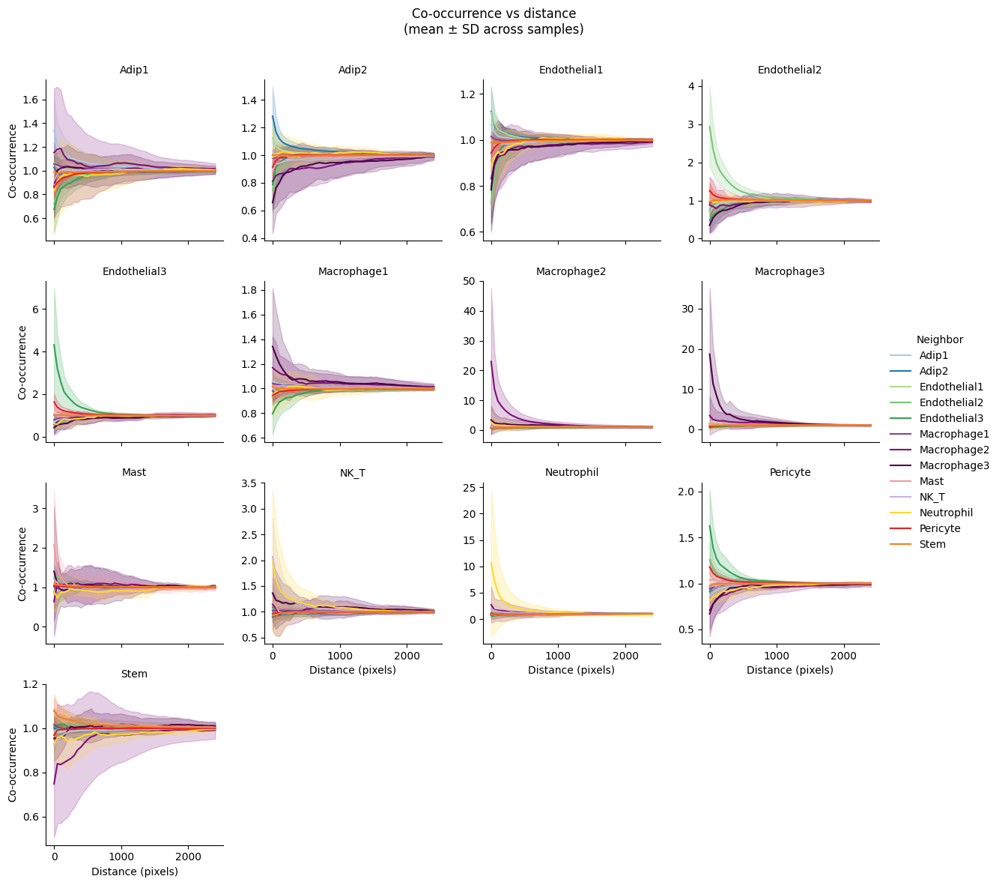

In [126]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import squidpy as sq

# --- 0) Ensure expected dtypes ---
adata.obs["CellType"] = adata.obs["CellType"].astype("category")

# If you have library_id already, use it; else use `samples`
if "library_id" in adata.obs.columns:
    libs = list(adata.obs["library_id"].cat.categories
                if hasattr(adata.obs["library_id"], "cat") else np.unique(adata.obs["library_id"]))
    lib_key = "library_id"
else:
    libs = list(np.unique(adata.obs["samples"]))
    lib_key = "samples"

# Only keep libraries that actually have all categories present
expected_cts = list(adata.obs["CellType"].cat.categories)
good_libs = []
for lib in libs:
    n_present = adata[adata.obs[lib_key] == lib].obs["CellType"].nunique()
    if n_present == len(expected_cts):
        good_libs.append(lib)

print(f"Using {len(good_libs)} samples with all {len(expected_cts)} cell types.")

# --- 1) Collect per-library co-occurrence into a long dataframe ---
rows = []
for lib in good_libs:
    adata_sub = adata[adata.obs[lib_key] == lib].copy()
    adata_sub.obs["CellType"] = adata_sub.obs["CellType"].astype("category")

    # compute co-occurrence
    sq.gr.co_occurrence(adata_sub, cluster_key="CellType")

    # grab the result cube
    occ = adata_sub.uns["CellType_co_occurrence"]["occ"]
    # occ should be (n_ref, n_neigh, n_bins)
    if occ.ndim == 2:
        # Some versions may return (n_neigh, n_bins) if ref was implicitly "all".
        # In that case, treat the same curve for each ref (not ideal, but keeps code running).
        occ = np.stack([occ] * len(expected_cts), axis=0)

    n_ref, n_neigh, n_bins = occ.shape
    # Squidpy plotting converts bins to distances internally; if bins/edges are not stored,
    # use bin index as x-axis (or multiply by an assumed step, e.g. 50 pixels).
    # If you prefer pixels, set step_px to your scale (e.g., 50).
    step_px = 50
    distances = np.arange(n_bins) * step_px

    for i, ref_ct in enumerate(expected_cts):
        for j, neigh_ct in enumerate(expected_cts):
            vals = np.asarray(occ[i, j, :]).ravel()
            # safety: align lengths if needed
            m = min(len(distances), len(vals))
            rows.append(pd.DataFrame({
                "distance": distances[:m],
                "value": vals[:m],
                "ref_ct": ref_ct,
                "neigh_ct": neigh_ct,
                "library": lib,
            }))

coocc_long = pd.concat(rows, ignore_index=True)

# --- 2) Faceted plot: one facet per reference cell type, 13 lines (neighbors) each ---
# If you want your custom colors per CellType for the neighbor lines, pass a dict:
color_dict = {
    "Adip1": "#a6cee2",
    "Adip2": "#2179b4",
    "Endothelial1": "#ADDD8E",
    "Endothelial2": "#78C679",
    "Endothelial3": "#31A354",
    "Macrophage1": "#88419D",
    "Macrophage2": "#4D004B",
    "Mast": "#f6999a",
    "NK_T": "#cab3d6",
    "Neutrophil": "#B3B3B3",
    "Pericyte": "#e21f26",
    "Stem1": "#FEB24C",
    "Stem2": "#FD8D3C"
}

# Use seaborn relplot so we can facet + aggregate
g = sns.relplot(
    data=coocc_long,
    kind="line",
    x="distance",
    y="value",
    hue="neigh_ct",               # 13 lines per facet (one per neighbor type)
    col="ref_ct",                  # one facet per reference type
    col_wrap=4,                    # grid layout
    estimator="mean",              # average across libraries
    errorbar="sd",                 # show variability across libraries
    palette=color_dict,            # consistent colors by cell type
    height=3,
    facet_kws=dict(sharey=False)   # independent y scales per facet
)
g.set_axis_labels("Distance (pixels)", "Co-occurrence")
g.set_titles(col_template="{col_name}")
g._legend.set_title("Neighbor")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Co-occurrence vs distance\n(mean ± SD across samples)")

# save to PDF
g.fig.savefig("co_occurrence_summary_facets_13x13.pdf", bbox_inches="tight")
plt.show()

/Users/ahn/squidpy_env/lib/python3.13/site-packages/anndata/_core/anndata.py:1791: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Using 9 samples with all 13 cell types.



  0%|                                                                         | 0/1 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method d

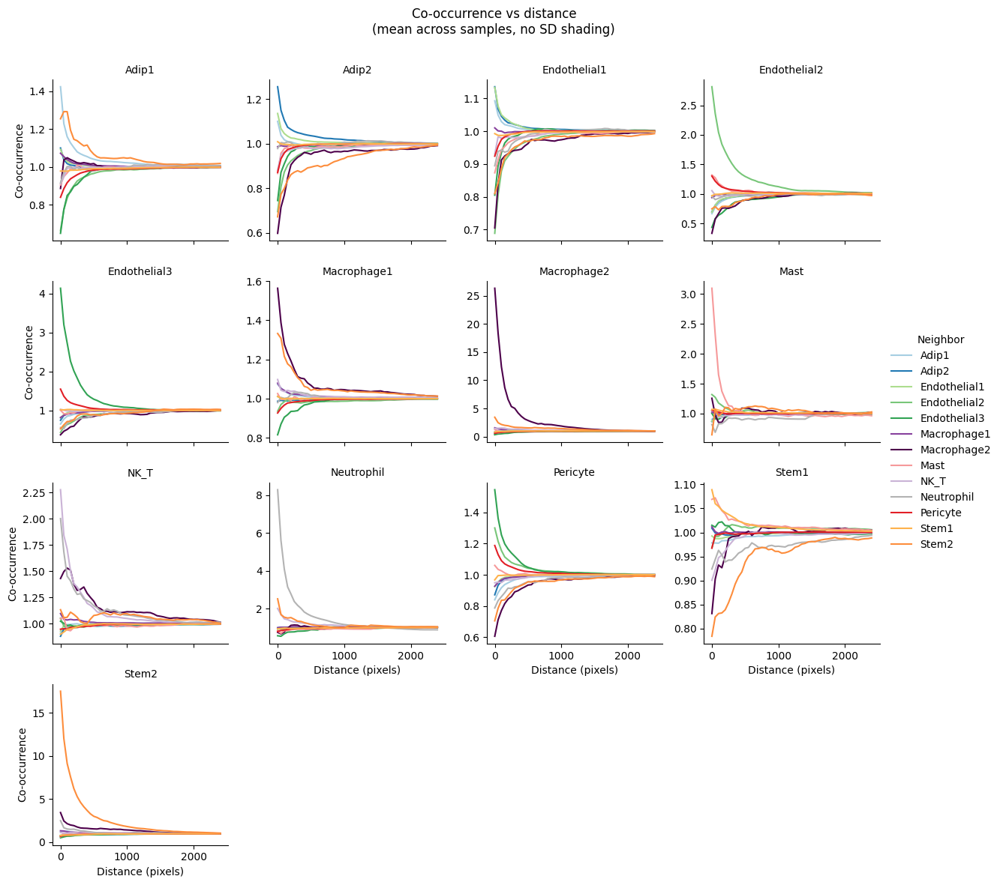

In [44]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import squidpy as sq

# --- 0) Ensure expected dtypes ---
adata.obs["CellType"] = adata.obs["CellType"].astype("category")

# If you have library_id already, use it; else use `samples`
if "library_id" in adata.obs.columns:
    libs = list(adata.obs["library_id"].cat.categories
                if hasattr(adata.obs["library_id"], "cat") else np.unique(adata.obs["library_id"]))
    lib_key = "library_id"
else:
    libs = list(np.unique(adata.obs["samples"]))
    lib_key = "samples"

# Only keep libraries that actually have all categories present
expected_cts = list(adata.obs["CellType"].cat.categories)
good_libs = []
for lib in libs:
    n_present = adata[adata.obs[lib_key] == lib].obs["CellType"].nunique()
    if n_present == len(expected_cts):
        good_libs.append(lib)

print(f"Using {len(good_libs)} samples with all {len(expected_cts)} cell types.")

# --- 1) Collect per-library co-occurrence into a long dataframe ---
rows = []
for lib in good_libs:
    adata_sub = adata[adata.obs[lib_key] == lib].copy()
    adata_sub.obs["CellType"] = adata_sub.obs["CellType"].astype("category")

    # compute co-occurrence
    sq.gr.co_occurrence(adata_sub, cluster_key="CellType")

    # grab the result cube
    occ = adata_sub.uns["CellType_co_occurrence"]["occ"]
    # occ should be (n_ref, n_neigh, n_bins)
    if occ.ndim == 2:
        # Some versions may return (n_neigh, n_bins) if ref was implicitly "all".
        # In that case, treat the same curve for each ref (not ideal, but keeps code running).
        occ = np.stack([occ] * len(expected_cts), axis=0)

    n_ref, n_neigh, n_bins = occ.shape
    # Squidpy plotting converts bins to distances internally; if bins/edges are not stored,
    # use bin index as x-axis (or multiply by an assumed step, e.g. 50 pixels).
    # If you prefer pixels, set step_px to your scale (e.g., 50).
    step_px = 50
    distances = np.arange(n_bins) * step_px

    for i, ref_ct in enumerate(expected_cts):
        for j, neigh_ct in enumerate(expected_cts):
            vals = np.asarray(occ[i, j, :]).ravel()
            # safety: align lengths if needed
            m = min(len(distances), len(vals))
            rows.append(pd.DataFrame({
                "distance": distances[:m],
                "value": vals[:m],
                "ref_ct": ref_ct,
                "neigh_ct": neigh_ct,
                "library": lib,
            }))

coocc_long = pd.concat(rows, ignore_index=True)

# --- 2) Faceted plot: one facet per reference cell type, 13 lines (neighbors) each ---
# If you want your custom colors per CellType for the neighbor lines, pass a dict:
color_dict = {
    "Adip1": "#a6cee2",
    "Adip2": "#2179b4",
    "Endothelial1": "#ADDD8E",
    "Endothelial2": "#78C679",
    "Endothelial3": "#31A354",
    "Macrophage1": "#88419D",
    "Macrophage2": "#4D004B",
    "Mast": "#f6999a",
    "NK_T": "#cab3d6",
    "Neutrophil": "#B3B3B3",
    "Pericyte": "#e21f26",
    "Stem1": "#FEB24C",
    "Stem2": "#FD8D3C"
}

# Use seaborn relplot so we can facet + aggregate
g = sns.relplot(
    data=coocc_long,
    kind="line",
    x="distance",
    y="value",
    hue="neigh_ct",
    col="ref_ct",
    col_wrap=4,
    estimator="mean",        # mean across libraries
    errorbar=None,           # no SD shading
    palette=color_dict,
    height=3,
    facet_kws=dict(sharey=False)
)
g.set_axis_labels("Distance (pixels)", "Co-occurrence")
g.set_titles(col_template="{col_name}")
g._legend.set_title("Neighbor")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Co-occurrence vs distance\n(mean across samples, no SD shading)")

# save to PDF
g.fig.savefig("co_occurrence_summary_facets_13x13_noSD.pdf", bbox_inches="tight")
plt.show()

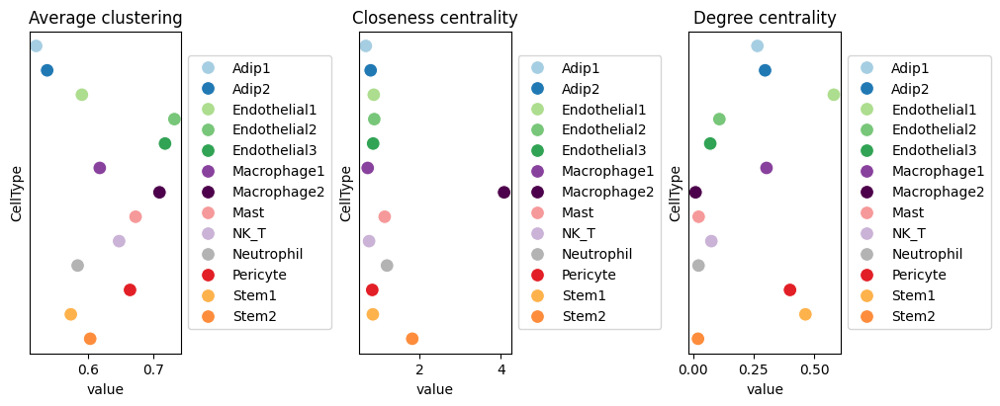

In [45]:
import matplotlib.colors as mcolors

# Define your custom color mapping
color_dict = {
    "Adip1": "#a6cee2",
    "Adip2": "#2179b4",
    "Endothelial1": "#ADDD8E",
    "Endothelial2": "#78C679",
    "Endothelial3": "#31A354",
    "Macrophage1": "#88419D",
    "Macrophage2": "#4D004B",
    "Mast": "#f6999a",
    "NK_T": "#cab3d6",
    "Neutrophil": "#B3B3B3",
    "Pericyte": "#e21f26",
    "Stem1": "#FEB24C",
    "Stem2": "#FD8D3C"
}

# Match the order of CellType categories
cats = list(adata.obs["CellType"].cat.categories)
palette_ordered = [color_dict[c] for c in cats]

# Store in `adata.uns` so Squidpy/Scanpy plots pick it up
adata.uns["CellType_colors"] = palette_ordered

# Now re-run centrality plots
sq.gr.centrality_scores(adata, cluster_key="CellType")

sq.pl.centrality_scores(
    adata,
    cluster_key="CellType",
    figsize=(10, 4),
    save="_centrality_scores.pdf",
    s=100
)

In [6]:
import squidpy as sq
import pandas as pd

# --- 1. Compute Moran’s I ---
sq.gr.spatial_autocorr(
    adata,
    mode="moran",
    n_perms=1000,   # increase to 1000 for publication-quality
    layer=None
)

# Extract Moran's I results
moran_df = adata.uns["moranI"].copy()

# Reset index so gene names are in a column
if moran_df.index.name is None:
    moran_df = moran_df.reset_index().rename(columns={"index": "gene"})
else:
    moran_df = moran_df.reset_index().rename(columns={moran_df.index.name: "gene"})

# Save to CSV
moran_df.to_csv("moranI_results.csv", index=False)

print(moran_df.head())

  0%|                                                                      | 0/1000 [00:00<?, ?/s]/Users/ahn/squidpy_env/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/ahn/squidpy_env/lib/python3.13/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/ahn/squidpy_env/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method de

     gene         I  pval_norm  var_norm  pval_z_sim  pval_sim   var_sim  \
0   CHIT1  0.422764        0.0   0.00001         0.0  0.000999  0.000011   
1  PLA2G7  0.381549        0.0   0.00001         0.0  0.000999  0.000008   
2    CTSD  0.355839        0.0   0.00001         0.0  0.000999  0.000009   
3   IGHG3  0.351530        0.0   0.00001         0.0  0.000999  0.000011   
4   TREM2  0.349642        0.0   0.00001         0.0  0.000999  0.000008   

   pval_norm_fdr_bh  pval_z_sim_fdr_bh  pval_sim_fdr_bh  
0               0.0                0.0         0.001282  
1               0.0                0.0         0.001282  
2               0.0                0.0         0.001282  
3               0.0                0.0         0.001282  
4               0.0                0.0         0.001282  
